# Workflow for the statistical analysis of domain images

by Christian Weymann

First, we do the necessary imports. If hystorian is installed on your system (via pip for example), you can comment out/delete the first three lines. Else, replace the path by a path to a folder that contains the hystorian package.

In [2]:
import sys
hyst_path = 'C:\\Users\\Christian\\Documents\\Python Scripts\\multiscale' #Change to your Hystorian Directory
sys.path.insert(0, hyst_path)

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm, patches

import hystorian as hy
from hystorian.processing import twodim
import h5py

import os
from glob import glob

from IPython.display import clear_output

## 1. Extracting and tagging the data

First, let's define the path where our data is/will be stored:

In [3]:
data_path = os.path.join(hyst_path, 'data')

Next, we load all the data in `raw_data_path` into the `.hdf5` format and store it in `data_path`. We make one `.hdf5` file per sample, by assuming the raw data filenames start with the sample name followed by an underscore.

In [5]:
allowed_extensions = set(('.ibw', '.sxm'))
raw_data_path = os.path.join(hyst_path, 'data', 'to_convert') #change to the location of your raw data

#Initialise the possibilities for each measurement
skipped_list = []
already_converted = []
to_convert = {}

#Iterate over all files in all subfolders of raw_data_path
for fn in glob(os.path.join(raw_data_path, '**'), recursive=True):
    
    #Skip anything that doesn't have an allowed extension
    if os.path.splitext(fn)[1] not in allowed_extensions:
        skipped_list.append(fn)
        continue
    
    #Find the sample name
    measurement_name = os.path.splitext(os.path.basename(fn))[0]
    sample_name = measurement_name.split('_')[0]
    combined_name = os.path.join(data_path, sample_name)
    
    #Check if the sample file exists 
    if os.path.isfile(combined_name+'.hdf5'):
        with h5py.File(combined_name+'.hdf5', 'r') as f:
            #Check if the measurement is already there
            if f'datasets/{measurement_name}' in f:
                already_converted.append(measurement_name)
                continue
    
    #Since the measurement is not there, add it to the list to convert
    to_convert.setdefault(combined_name, []).append(fn)
    
#Convert and combine all selected files
for combined_name, filelist in to_convert.items():
    hy.io.read_file.merge_hdf5(filelist, combined_name)

                 
    
print('The following measurements were converted previously and have been ignored:')
for mn in already_converted: print(mn)
print('\n')

print('The following files were skipped:')
for fn in skipped_list: print(fn)
print('If any of these files should have been included, check the allowed extensions.')
print('Don\'t forget to tag your files using the next cell!')

'C:\Users\Christian\Documents\Python Scripts\multiscale\data\to_convert\m21003b_topo_MC_009.hdf5' successfully merged
1/1 files merged into 'C:\Users\Christian\Documents\Python Scripts\multiscale\data\m21003b.hdf5'
The following measurements were converted previously and have been ignored:
m15109FM00
m20014DSOJ4_VDART_0002
m20014STO_VDART_0000
m20014STO_VDART_0002
m20014STO_VDART_0003
m20014STO_VDART_0004
m20014STO_VDART_0005
m21004DSOJ4_topo_MC_005
m21004DSOJ4_topo_MC_008
m21005b_topo_MC_006
m21005b_topo_MC_009
m21006DSOI2_topo_MC_005
m21007b_topo_MC_003
m20036_topo_MC_006
m20036_topo_MC_007
m20036_topo_MC_008
m20037_topo_MC_003
m20037_topo_MC_004
m20038_topo_MC_006
m20038_topo_MC_007
m20038_topo_MC_010
m20039_topo_MC_010
m20039_topo_MC_011
m20041_topo_MC_006
m20041_topo_MC_007
m21003DSOJ2_topo_MC_006
m21003DSOJ2_topo_MC_009
m21005DSOF2_topo_MC_005
m21005DSOF2_topo_MC_008
m21007DSOC3_topo_MC_005


The following files were skipped:
C:\Users\Christian\Documents\Python Scripts\multiscale

In the next cell, we interactivelly add the tags we will need to the `.hdf5` files. Note that this cell will only ask for the metadata if it is not already present. If you have made a mistake, see the next cell.

In [6]:
#Iterate over all data files in data_path
for fn in glob(os.path.join(data_path, '*.hdf5')):
    sample_name = os.path.splitext(os.path.basename(fn))[0]
    with h5py.File(fn, 'r+') as f:
        #check if sample thickness is given, ask for it if not
        if f['datasets'].attrs.get('Thickness_uc') is None:
            try:
                f['datasets'].attrs.create('Thickness_uc',
                                            int(input(f'What is the thickness of {sample_name} in uc?')))
            except ValueError:
                pass
        #check if there are any untaged measurements
        for name, measurement in f['datasets'].items():
            if measurement.attrs.get('Scan_type') is None:
                measurement.attrs.create('Scan_type', 
                                         input(f'What type of scan is {name}? Please answer PFM or topo. '))

What is the thickness of m21003b in uc?
What type of scan is m21003b_topo_MC_009? Please answer PFM or topo. 


If you have made a mistake while tagging your files, the following cell shows an example of how to change the value of an attribute.

In [7]:
sample_name = 'm21003b'
with h5py.File(os.path.join(data_path, sample_name)+'.hdf5', 'r+') as f:
    f['datasets'].attrs['Thickness_uc'] = 22
    f['datasets/m21003b_topo_MC_009'].attrs['Scan_type'] = 'topo'

## 2. Applications examples

### 2.1 Dummy data

First, we test the autocorrelation kit on dummy data.

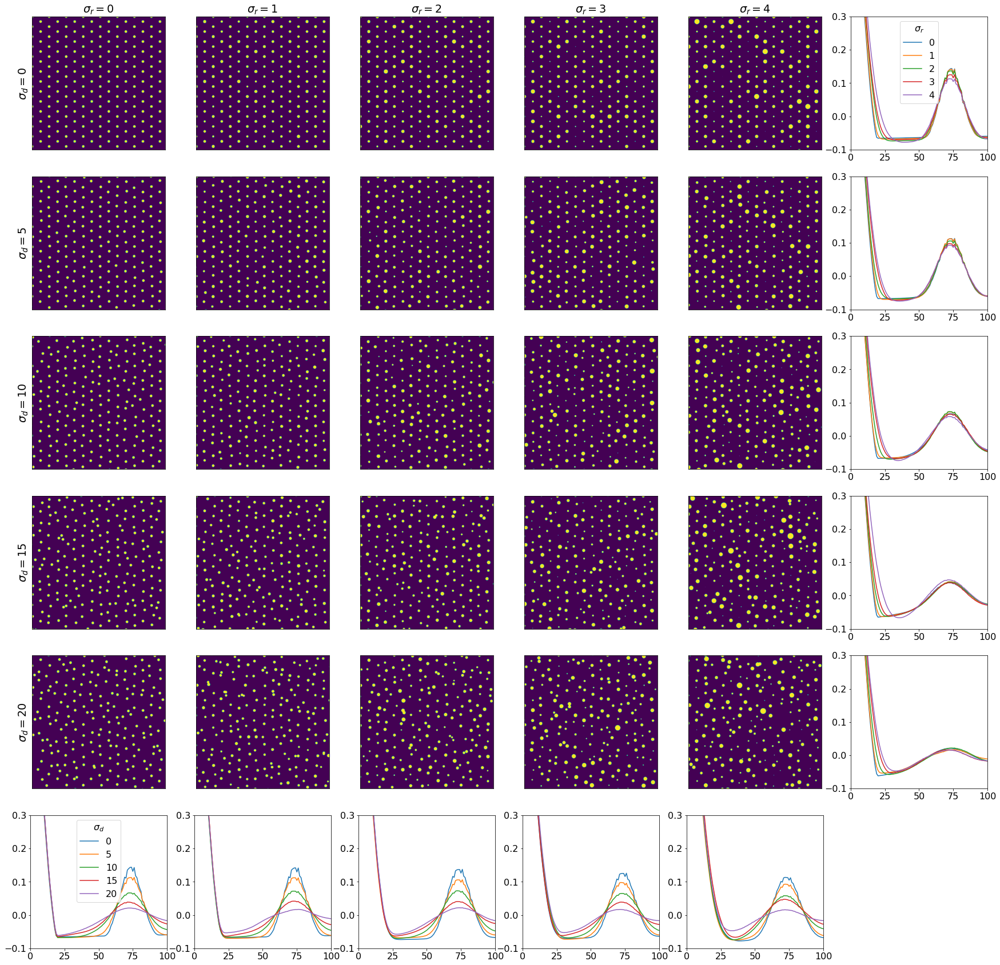

In [10]:
#Make the font bigger
plt.rcParams.update({'font.size': 16,
                     'axes.titlesize': 'large',
                     'axes.labelsize': 'large',
                    })

#Select parameters
lattsize = 1000
r = 10
dr = 0
d = 75
dd = 0
dds = [0, 5, 10, 15, 20]
drs = [0, 1, 2, 3, 4]

np.random.seed(0) #for reproducibility

#Prep the figure
fig, axs_lines = plt.subplots(len(dds)+1, len(drs)+1, figsize=(5 * (len(drs)+1), 5 * (len(dds)+1)))
xlims = (0.0, 100)
ylims = (-0.1, 0.3)

#Go over each pair of radial and distance disorder
for axs, dd in zip(axs_lines[:-1], dds):
    for j, (ax, dr) in enumerate(zip(axs[:-1], drs)):
        #Generate and plot the lattice
        lattice = twodim.generate_triangular_lattice(lattsize, r, dr, d, dd)

        ax.imshow(lattice)
        ax.set_xticks([])
        ax.set_yticks([])
        
        #Compute the autocorrelation
        ac = twodim.autocorrelate(lattice, mode = 'same')#padding='wrap')     
        
        #Compute the radial average and plot it on the graphs at the end of the line and the column
        x, y = twodim.radial_average(ac)
                              
        axs[-1].plot(x, y)                                    
        axs_lines[-1][j].plot(x, y)

#Prettyfy figure      
    axs[-1].set_xlim(xlims)
    axs[-1].set_ylim(ylims)
                              
for ax in axs_lines[-1]:
    ax.set_xlim(xlims)
    ax.set_ylim(ylims)

axs_lines[0][-1].legend(drs, title='$\sigma_r$')
axs_lines[-1][0].legend(dds, title='$\sigma_d$')

for ax, dr in zip(axs_lines[0][:-1], drs):
    ax.set_title('$\sigma_r = {}$'.format(dr))
    
for ax, dd in zip(axs_lines[:-1, 0], dds):
    ax.set_ylabel('$\sigma_d = {}$'.format(dd))

fig.delaxes(axs_lines[-1][-1])

### 2.2 PFM data

Next, we show how to use it on (isotropic) PFM data. The parameters which might be usefull to chang are on top. The procedure can throw a lot of scipy warnings, but the end result shouldn't be affected.

C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)


C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)


C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)
C:\Users\Christian\Anaconda3\lib\site-packages\scipy\ndimage\measurements.py:668: RuntimeWarning: invalid value encountered in true_divide
  return sum / numpy.asanyarray(count).astype(numpy.float64)


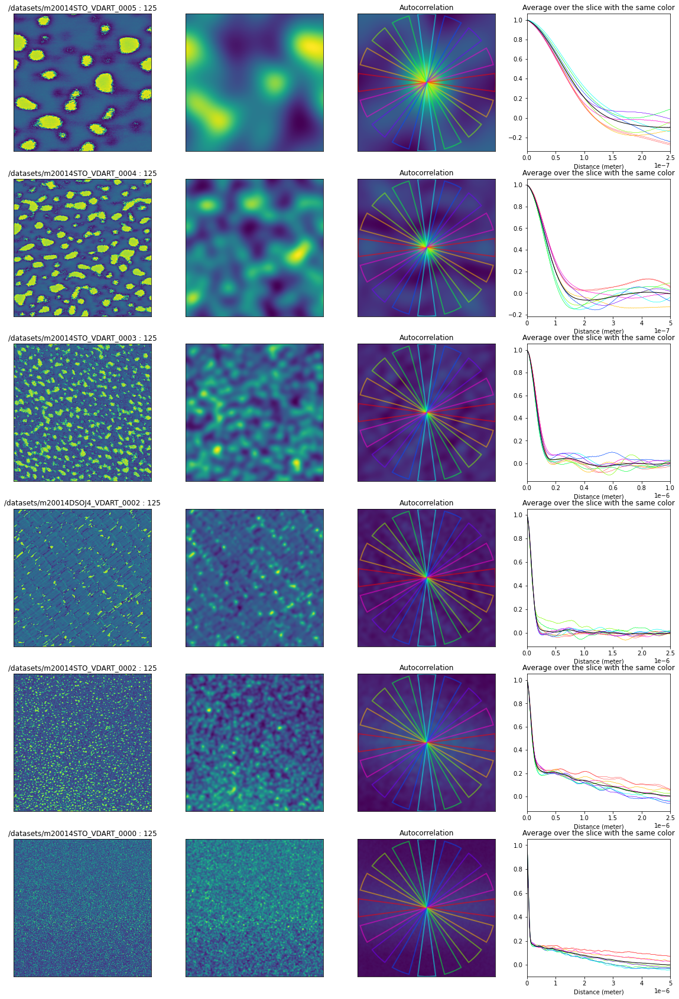

In [8]:
slices = 8 #number of direction slices for directional averages
tol = np.pi/slices/3 #size of each slice, in radian
blur_radius = 0.05e-6 #in meters
cmap = cm.hsv #colormap used

#Open all files
files = [h5py.File(fn, 'r') for fn in glob(os.path.join(data_path, '*.hdf5'))]

#Select all PFM scans, sorted by film thickness
thick_sort = lambda f: f['datasets'].attrs['Thickness_uc']
PFMs = [dataset['Phase1Retrace'] 
        for f in sorted(files, key=thick_sort) 
        for dataset in f['datasets'].values()
        if dataset.attrs['Scan_type'] == 'PFM'
       ]

#Prep the figure
fig, axs_lines = plt.subplots(len(PFMs),4, figsize=(20, 5*len(PFMs)))

size_sort = lambda scan: scan.attrs['size'][0]
for axs, data in zip(axs_lines, sorted(PFMs, key=size_sort)):
    #Set a title for the line
    axs[0].set_title(f'{data.parent.name} : {data.file["datasets"].attrs["Thickness_uc"]}')
    
    #compute the size of one pixel in meter
    scan_size = data.attrs['size'][0]
    pxsize = scan_size/data.attrs['shape'][0]
    r = int(blur_radius//pxsize)
    
    #compute and plot the blurred data and its autocorrelation
    treated = twodim.gaussian_blur(data, r=r)
    
    ac = twodim.autocorrelate(treated, mode = 'same')
    sx, sy = ac.shape

    axs[0].imshow(data)
    axs[0].set_xticks([])
    axs[0].set_yticks([])
    
    axs[1].imshow(treated)
    axs[1].set_xticks([])
    axs[1].set_yticks([])
    
    axs[2].imshow(ac)
    axs[2].set_title('Autocorrelation')
    axs[2].set_xticks([])
    axs[2].set_yticks([])

    #compute averages along different directions
    for i in range(-slices, slices):
        color = cmap((i + slices)/slices%1)
        angle = i*np.pi/slices
        x, y = twodim.radial_average(ac, angle, tol)
        axs[3].plot(x*pxsize, y+0.00*(i%slices), c = color, lw = 0.4)
        axs[2].add_patch(patches.Wedge((sx/2,sy/2),sx/2,(angle-tol)*180/np.pi, (angle+tol)*180/np.pi,
                                       alpha = 0.5, color = color, lw = 2, fill = False))
        
    #Compute and plot overall average
    x, y = twodim.radial_average(ac)
    axs[3].plot(x*pxsize, y, c = 'k', lw = 1)
    axs[3].set_xlim(0.0, scan_size/2)
    
    axs[3].set_title('Average over the slice with the same color')
    axs[3].set_xlabel('Distance (meter)')
    
    
#Close all files    
for f in files: f.close()

As a safety, in case the cell above crashes, the cell below closes all the files that were opened there.

In [37]:
for f in files: f.close()

### 2.3 Highly directional AFM data

Several indicators can be used to determine directions of interest in the case of highly directional data. This first cell lets you test each of them on your choice of random noise, or a highly regular lattice of circles. The three implemented options are:
* `central`, which roughly shows how little the image changes when it is shifted perpendicular to a given direction
* `amplitude`, which tries to estimate the amplitude of the first oscillation in the autocorrelation when it is projected on a given direction
* `fft`, which plots the fast fourier transform of the same projection

As before, the parameters you may want to modifiy are at the top of the cell.

(0.0, 100.0)

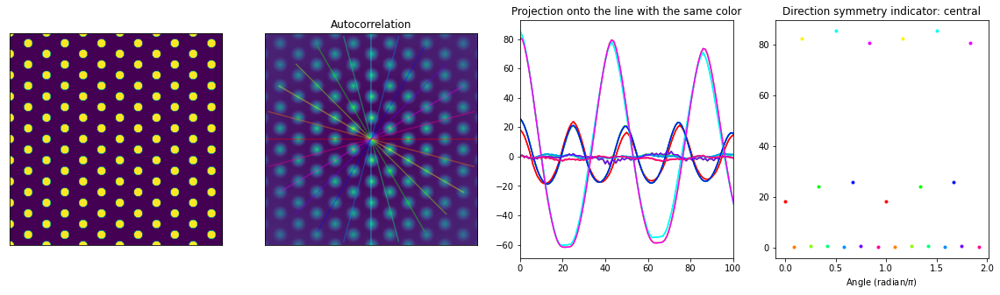

In [9]:
angle_step = np.pi/12 #angle step between successive averaging direction, e.g. np.pi/12
intensity_measure = 'central' #'central', 'amplitude', or 'fft'

#Genereate dummy data: either random noise or a highly symmetric lattice
data = twodim.generate_triangular_lattice(lattsize=500)
#data = np.random.random((500, 500))

#Define the helper function to measure the amplitude of the first oscillation
from scipy.signal import find_peaks
def compute_amplitude(y):
    """
    Finds the height difference between the highest maximum and the minimum closest to it.
    """
    loc_min_pos, _= find_peaks(-y)
    if loc_min_pos.size == 0:
        return 0
    else:
        max_pos = y.argmax()
        max_min_dist = np.abs(loc_min_pos-max_pos)
        min_dist_pos = max_min_dist.argmin()
        close_min_pos = loc_min_pos[min_dist_pos]
        return y[max_pos]-y[close_min_pos]
    
#Compute and plot the autocorrelation
ac = twodim.autocorrelate(data, mode = 'same')
sx, sy = ac.shape

fig, axs = plt.subplots(1,4, figsize=(20,5))

axs[0].imshow(data)
axs[1].set_title('Dummy data')
axs[0].set_xticks([])
axs[0].set_yticks([])
    
axs[1].imshow(ac)
axs[1].set_title('Autocorrelation')
axs[1].set_xticks([])
axs[1].set_yticks([])

#compute averages along different directions
for angle in np.arange(0, 2*np.pi, angle_step):
    color = cm.hsv(angle/np.pi%1)

    #compute and plot the average and the colored direction indicator
    x, y = twodim.projected_average(ac, angle=angle, symmetrical=False, mean=False)       
    axs[2].plot(x, y, color=color)
    axs[2].set_xlim(-scan_size/20,scan_size/2)
    axs[1].plot(((sx-1)/2*(1-np.cos(angle)),(sx-1)/2*(1+np.cos(angle))),
                ((sy-1)/2*(1-np.sin(angle)),(sy-1)/2*(1+np.sin(angle))), color=color, alpha=0.2)

    #show the choosen intensity measure
    if intensity_measure == 'central':
        axs[3].scatter(angle/np.pi, y[x==0], color=color, marker='.')
    elif intensity_measure == 'amplitude':
        axs[3].scatter(angle/np.pi, compute_amplitude(y), color=color, marker='.')
    elif intensity_measure == 'fft':
        axs[3].plot(np.abs(np.fft.fft(y)), color=color)
        axs[3].set_xlim(0, 350)
        axs[3].set_ylim(0, 2000)

axs[2].set_title('Projection onto the line with the same color')
axs[3].set_title('Direction symmetry indicator: '+intensity_measure)
axs[3].set_xlabel('Angle (radian/$\pi$)')

axs[2].set_xlim(0,100)

Next, we use the same process on topographical data of a selected size.

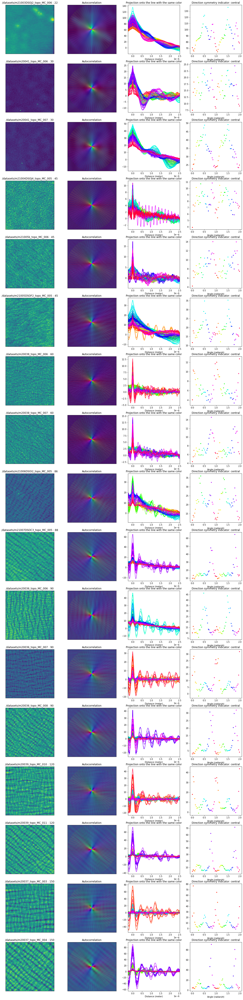

In [10]:
selected_size = 5e-6 #what scan size to analyse
angle_step = 0.1 #angle step between successive averaging direction, e.g. np.pi/12
intensity_measure = 'central' #'central', 'amplitude', or 'fft'

#Define the helper function to measure the amplitude of the first oscillation
from scipy.signal import find_peaks
def compute_amplitude(y):
    """
    Finds the height difference between the highest maximum and the minimum closest to it.
    """
    loc_min_pos, _= find_peaks(-y)
    if loc_min_pos.size == 0:
        return 0
    else:
        max_pos = y.argmax()
        max_min_dist = np.abs(loc_min_pos-max_pos)
        min_dist_pos = max_min_dist.argmin()
        close_min_pos = loc_min_pos[min_dist_pos]
        return y[max_pos]-y[close_min_pos]
    
#Open all files
files = [h5py.File(fn, 'r') for fn in glob(os.path.join(data_path, '*.hdf5'))]

#Select all topographies of specified size, sorted by film thickness
thick_sort = lambda f: f['datasets'].attrs['Thickness_uc']
topographies = [dataset['Z (m) - Retrace'] 
                for f in sorted(files, key=thick_sort) 
                for dataset in f['datasets'].values()
                if (dataset.attrs['Scan_type'] == 'topo' and
                    np.isclose(dataset['Z (m) - Retrace'].attrs['size'][0], selected_size))
               ]

#Prep the figure
fig, axs_lines = plt.subplots(len(topographies),4, figsize=(20, 5*len(topographies)))

for axs, data in zip(axs_lines, topographies):
    #Set a title for the line
    axs[0].set_title(f'{data.parent.name} : {data.file["datasets"].attrs["Thickness_uc"]}')
    
    #compute the size of one pixel in meter
    scan_size = data.attrs['size'][0]
    pxsize = scan_size/data.attrs['shape'][0]
    
    #flatten the topography
    #data = twodim.plane_flatten_image(data, order=2)
    data = twodim.line_median_align(data)
    data = twodim.plane_flatten_image(data, order=2)
    data = twodim.line_median_align(data)

    #compute and plot the autocorrelation
    ac = twodim.autocorrelate(data, mode = 'same')
    sx, sy = ac.shape

    axs[0].imshow(data)
    axs[0].set_xticks([])
    axs[0].set_yticks([])
    
    axs[1].imshow(ac)
    axs[1].set_title('Autocorrelation')
    axs[1].set_xticks([])
    axs[1].set_yticks([])

    #compute averages along different directions
    for angle in np.arange(0, 2*np.pi, angle_step):
        color = cm.hsv(angle/np.pi%1)
        
        #compute and plot the average and the colored direction indicator
        x, y = twodim.projected_average(ac, angle=angle, symmetrical=False, mean=False)       
        axs[2].plot(x*pxsize, y, color=color)
        axs[2].set_xlim(-scan_size/20,scan_size/2)
        axs[1].plot(((sx-1)/2*(1-np.cos(angle)),(sx-1)/2*(1+np.cos(angle))),
                    ((sy-1)/2*(1-np.sin(angle)),(sy-1)/2*(1+np.sin(angle))), color=color, alpha=0.2)
        
        #show the choosen intensity measure
        if intensity_measure == 'central':
            axs[3].scatter(angle/np.pi, y[x==0], color=color, marker='.')
        elif intensity_measure == 'amplitude':
            axs[3].scatter(angle/np.pi, compute_amplitude(y), color=color, marker='.')
        elif intensity_measure == 'fft':
            axs[3].plot(np.abs(np.fft.fft(y)), color=color)
            axs[3].set_xlim(0, 350)
            axs[3].set_ylim(0, 2000)
    
    axs[2].set_title('Projection onto the line with the same color')
    axs[2].set_xlabel('Distance (meter)')
    axs[3].set_title('Direction symmetry indicator: '+intensity_measure)
    axs[3].set_xlabel('Angle (radian/$\pi$)')
    
#Close all files    
for f in files: f.close()

As a safety, in case the cell above crashes, the cell below closes all the files that were opened there.

In [22]:
for f in files: f.close()

If we want to use the power density spectrum (square of the Fourier transform) instead of the autocorrelation, the next cell provides an example.

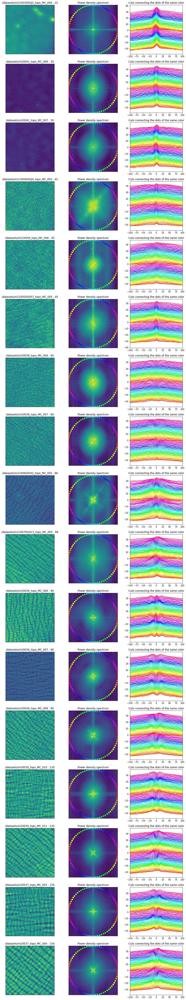

In [12]:
selected_size = 5e-6 #what scan size to analyse
angle_step = np.pi/36 #angle step between successive averaging direction, e.g. np.pi/36

#Open all files
files = [h5py.File(fn, 'r') for fn in glob(os.path.join(data_path, '*.hdf5'))]

#Select all topographies of specified size, sorted by film thickness
thick_sort = lambda f: f['datasets'].attrs['Thickness_uc']
topographies = [dataset['Z (m) - Retrace'] 
                for f in sorted(files, key=thick_sort) 
                for dataset in f['datasets'].values()
                if (dataset.attrs['Scan_type'] == 'topo' and
                    np.isclose(dataset['Z (m) - Retrace'].attrs['size'][0], selected_size))
               ]

#Prep the figure
fig, axs_lines = plt.subplots(len(topographies),3, figsize=(15, 5*len(topographies)))

for axs, data in zip(axs_lines, topographies):
    #Set a title for the line
    axs[0].set_title(f'{data.parent.name} : {data.file["datasets"].attrs["Thickness_uc"]}')
    
    #Flatten the topography
    #data = twodim.plane_flatten_image(data, order=2)
    data = twodim.line_median_align(data)
    data = twodim.plane_flatten_image(data, order=2)
    data = twodim.line_median_align(data)

    #Compute and plot the denoised power density spectrum
    pds = twodim.gaussian_blur(np.log(np.abs(np.fft.fftshift(np.fft.fft2(data)))**2), r=2)
    sx, sy = pds.shape
    min_size = min(sx, sy)
    
    axs[0].imshow(data)
    axs[0].set_xticks([])
    axs[0].set_yticks([])
    
    axs[1].imshow(pds)
    axs[1].set_title('Power density spectrum')
    axs[1].set_xticks([])
    axs[1].set_yticks([])
    
    #Plot a cut in several directions
    x=np.arange(-min_size//2+1, min_size//2-1)
    for angle in np.arange(0, 2*np.pi, angle_step):
        color = cm.hsv(angle/np.pi%1)
        
        #Extract the pixels closest to a multiple of the unit vector in the direction of angle
        unit_v = np.array([np.cos(angle), np.sin(angle)])
        y = np.array([pds[tuple(np.round(unit_v*xi).astype(int)+min_size//2-1)] for xi in x])
        
        #Plot the cuts, use dot as direction indicators to not obstruct the center
        axs[2].plot(x, y+10*angle, color=color)
        axs[1].scatter(((sx-1)/2*(1-np.cos(angle)),(sx-1)/2*(1+np.cos(angle))),
                       ((sy-1)/2*(1-np.sin(angle)),(sy-1)/2*(1+np.sin(angle))), color=color, alpha=1)
        

    axs[2].set_xlim(-100,100)
    axs[2].set_title('Cuts connecting the dots of the same color')

#Close all files
for f in files: f.close()

As a safety, in case the cell above crashes, the cell below closes all the files that were opened there.

In [22]:
for f in files: f.close()